# Facebook Metrics

## Description

The Facebook Metrics dataset contains 7 features known prior to publishing a post on a renowned cosmetics brand's Facebook page. The 12 metrics that follow are used to evaluate the impact of a post given the first 7 features.

The column attributes are as follows:

| Column Name | Description |
| - | - |
| page_likes | Total likes on the page |
| post_type | Type of the post to be published |
| post_category | Category of the post to be published |
| month | Month of the date to be published |
| weekday | Weekday of the date to be published |
| hour | Hour of the date to be published |
| cost | Sum paid in advertising the post to be published |
| reach | Number of users reached in the post's lifetime |
| impressions | Number of total impressions in the post's lifetime |
| engagements | Number of users engaged in the post's lifetime |
| consumers | Consumers gained in the post's lifetime |
| consumptions | Comsumptions gained in the post's lifetime |
| liked_impressions | Number of impressions in the post's lifetime by users who have liked the page |
| liked_reach | Number of users reached in the post's lifetime by users who like the page |
| liked_engagements | Number of users engaged in the post's lifetime by users who like the page |
| comments | Number of comments |
| likes | Number of likes |
| shares | Number of shares |
| interactions | Total number of interactions |

[Source](http://archive.ics.uci.edu/ml/datasets/Facebook+metrics)

## Importing the Dataset

In [3]:
import pandas as pd

column_names = ['page_likes',
                'post_type',
                'post_category',
                'month',
                'weekday',
                'hour',
                'cost',
                'reach',
                'impressions',
                'engagements',
                'consumers',
                'consumptions',
                'liked_impressions',
                'liked_reach',
                'liked_engagements',
                'comments',
                'likes',
                'shares',
                'interactions']

features = column_names[:-12]
targets = column_names[-12:]

with open("../../datasets/regression/dataset_Facebook.csv", "r") as dataset_file:
    raw_data = pd.read_csv(dataset_file, delimiter=';', header=0, names=column_names)

## Preparing the Dataset

In [4]:
prepared_data = raw_data.fillna(-1)

The following block prints the shape and column datatypes of the processed dataset.

In [5]:
print(prepared_data.shape)
print(prepared_data.dtypes)

(500, 19)
page_likes             int64
post_type             object
post_category          int64
month                  int64
weekday                int64
hour                   int64
cost                 float64
reach                  int64
impressions            int64
engagements            int64
consumers              int64
consumptions           int64
liked_impressions      int64
liked_reach            int64
liked_engagements      int64
comments               int64
likes                float64
shares               float64
interactions           int64
dtype: object


## Preprocessing the Dataset

In [6]:
from sklearn.model_selection import train_test_split

X_full = prepared_data[features].copy()
y_full = prepared_data[targets].copy()

# Split the dataset into two parts, one part training, the other, testing and valating.
X_train, X_test_and_val, y_train, y_test_and_val = train_test_split(X_full, y_full, 
                                                        train_size=0.6,
                                                        random_state=0)
# Split the second part from the previous split into two parts, one part testing, the other, valating.
X_test, X_val, y_test, y_val = train_test_split(X_test_and_val, y_test_and_val, 
                                                        train_size=0.5,
                                                        random_state=0)

object_cols = ['post_type']
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder


# Drop categorical columns.
drop_X_train = X_train.select_dtypes(exclude=['object'])
drop_X_test = X_test.select_dtypes(exclude=['object'])
drop_X_val = X_val.select_dtypes(exclude=['object'])

# Apply ordinal encoder to each column with categorical data
OE_X_train = X_train.copy()
OE_X_test = X_test.copy()
OE_X_val = X_val.copy()

ordinal_encoder = OrdinalEncoder()
OE_X_train[object_cols] = ordinal_encoder.fit_transform(X_train[object_cols])
OE_X_test[object_cols] = ordinal_encoder.transform(X_test[object_cols])
OE_X_val[object_cols] = ordinal_encoder.transform(X_val[object_cols])

# Apply one-hot encoder to each column with categorical data
OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
OH_cols_train = pd.DataFrame(OH_encoder.fit_transform(X_train[object_cols]))
OH_cols_test = pd.DataFrame(OH_encoder.transform(X_test[object_cols]))
OH_cols_val = pd.DataFrame(OH_encoder.transform(X_val[object_cols]))
# Put back removed index from One-hot encoding
OH_cols_train.index = X_train.index
OH_cols_test.index = X_test.index
OH_cols_val.index = X_val.index
# Remove categorical columns (will replace with one-hot encoding)
num_X_train = X_train.drop(object_cols, axis=1)
num_X_test = X_test.drop(object_cols, axis=1)
num_X_val = X_val.drop(object_cols, axis=1)
# Add one-hot encoded columns to numerical features
OH_X_train = pd.concat([num_X_train, OH_cols_train], axis=1)
OH_X_test = pd.concat([num_X_test, OH_cols_test], axis=1)
OH_X_val = pd.concat([num_X_val, OH_cols_val], axis=1)

## Training on Multiple Classifiers

In [2]:
#Manage imports 
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.neural_network import MLPRegressor
from utilities import train_estimators, plot_estimator_scores

### Logistic Regression Classification

In [12]:
for target in targets:
    LinearRegressionEstimator = LinearRegression().fit(drop_X_train, y_train[target])
    LR_train_score = LinearRegressionEstimator.score(drop_X_train, y_train[target])
    LR_test_score = LinearRegressionEstimator.score(drop_X_test, y_test[target])
    LR_val_score = LinearRegressionEstimator.score(drop_X_val, y_val[target])
    print(f'{LR_train_score=}, {LR_test_score=}, {LR_val_score=}')
    LinearRegressionEstimator = LinearRegression().fit(OE_X_train, y_train[target])
    LR_train_score = LinearRegressionEstimator.score(OE_X_train, y_train[target])
    LR_test_score = LinearRegressionEstimator.score(OE_X_test, y_test[target])
    LR_val_score = LinearRegressionEstimator.score(OE_X_val, y_val[target])
    print(f'{LR_train_score=}, {LR_test_score=}, {LR_val_score=}')
    LinearRegressionEstimator = LinearRegression().fit(OH_X_train, y_train[target])
    LR_train_score = LinearRegressionEstimator.score(OH_X_train, y_train[target])
    LR_test_score = LinearRegressionEstimator.score(OH_X_test, y_test[target])
    LR_val_score = LinearRegressionEstimator.score(OH_X_val, y_val[target])
    print(f'{LR_train_score=}, {LR_test_score=}, {LR_val_score=}')

LR_train_score=0.06782220582088605, LR_test_score=0.07761330803873767, LR_val_score=-0.4484776771189374
LR_train_score=0.07493144334051349, LR_test_score=0.09630897794259174, LR_val_score=-0.3793216098368841
LR_train_score=0.09831502604721987, LR_test_score=0.1244524625971255, LR_val_score=-0.42741888207182455
LR_train_score=0.04146401675429878, LR_test_score=-0.06601169129395101, LR_val_score=-1.535945110971352
LR_train_score=0.043428346010479846, LR_test_score=-0.035939709327295066, LR_val_score=-1.441915722420871
LR_train_score=0.04833883823702456, LR_test_score=-0.016680238688510984, LR_val_score=-1.4958552599314263
LR_train_score=0.04608174840021062, LR_test_score=0.003327914464133941, LR_val_score=-0.1994385239234251
LR_train_score=0.17068403043648916, LR_test_score=0.10180954160004674, LR_val_score=0.2366830526015512
LR_train_score=0.1848496098093625, LR_test_score=0.22568368347513612, LR_val_score=0.2745703986894594
LR_train_score=0.05637694624218825, LR_test_score=0.0094341974

### SVM Classification

Training SVR(C=0.01, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.1, gamma=0.0001, max_iter=10000)...
Training SVR(C=1.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=10.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=100.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.01, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.1, gamma=0.0001, max_iter=10000)...
Training SVR(C=1.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=10.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=100.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.01, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.1, gamma=0.0001, max_iter=10000)...
Training SVR(C=1.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=10.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=100.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.01, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.1, gamma=0.0001, max_iter=10000)...
Training SVR(C=1.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=10.0, gamma=0.0001

c:\Users\pasca\Google Drive\University Documents\2021 - Fall\COMP 432\comp_432_group_project\notebooks\regression\utilities.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Training SVR(C=0.01, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.1, gamma=0.0001, max_iter=10000)...
Training SVR(C=1.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=10.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=100.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.01, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.1, gamma=0.0001, max_iter=10000)...
Training SVR(C=1.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=10.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=100.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.01, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.1, gamma=0.0001, max_iter=10000)...
Training SVR(C=1.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=10.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=100.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.01, gamma=0.0001, max_iter=10000)...
Training SVR(C=0.1, gamma=0.0001, max_iter=10000)...
Training SVR(C=1.0, gamma=0.0001, max_iter=10000)...
Training SVR(C=10.0, gamma=0.0001

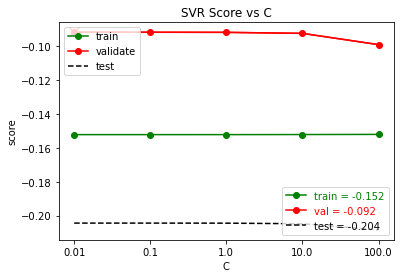

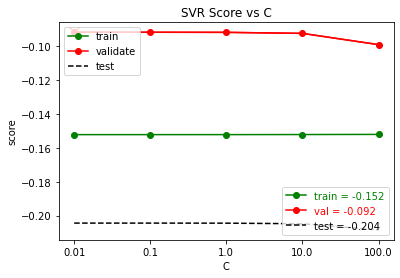

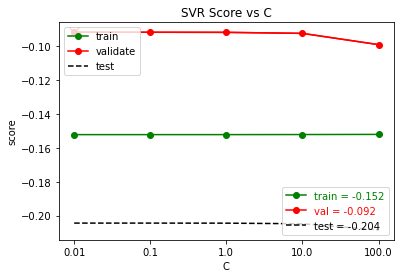

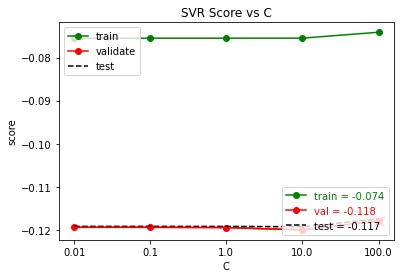

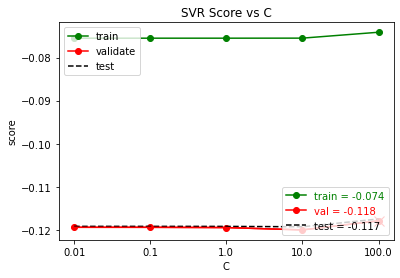

...

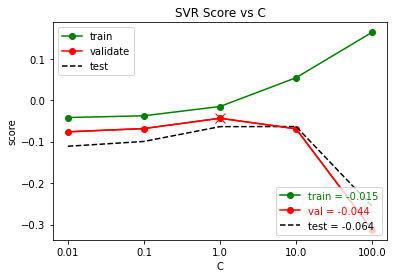

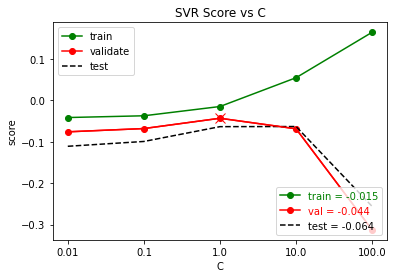

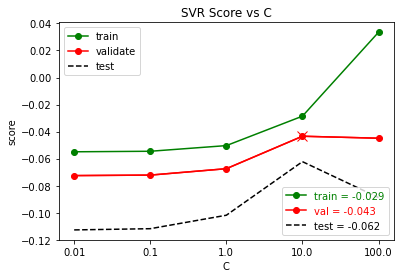

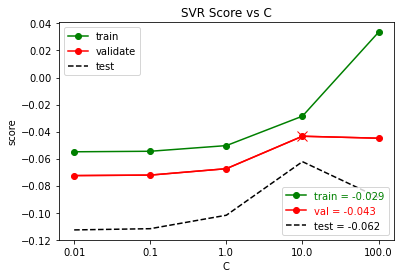

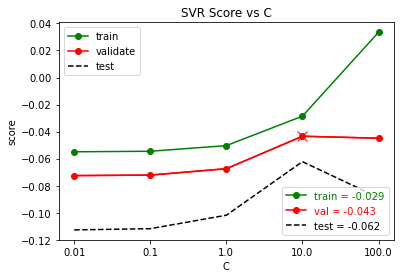

In [14]:
adjusted_parameter = 'C'
adjusted_parameter_values = [0.01, 0.1, 1.0, 10.0, 100.0]

for target in targets:
    SVMEstimators = train_estimators(drop_X_train, y_train[target],
                                        SVR,
                                        adjusted_parameter, adjusted_parameter_values,
                                        gamma=0.0001,
                                        max_iter=10000)
    plot_estimator_scores(SVMEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            drop_X_train, y_train[target], drop_X_test, y_test[target], drop_X_val, y_val[target])


    SVMEstimators = train_estimators(OE_X_train, y_train[target],
                                        SVR,
                                        adjusted_parameter, adjusted_parameter_values,
                                        gamma=0.0001,
                                        max_iter=10000)
    plot_estimator_scores(SVMEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OE_X_train, y_train[target], OE_X_test, y_test[target], OE_X_val, y_val[target])


    SVMEstimators = train_estimators(OH_X_train, y_train[target],
                                        SVR,
                                        adjusted_parameter, adjusted_parameter_values,
                                        gamma=0.0001,
                                        max_iter=10000)
    plot_estimator_scores(SVMEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OH_X_train, y_train[target], OH_X_test, y_test[target], OH_X_val, y_val[target])

### Decision Tree Classification

Training DecisionTreeRegressor(max_depth=1, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=5, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=10, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=20, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=50, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=100, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=1, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=5, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=10, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=20, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=50, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=100, splitter='random', random_state=0)...
Traini

c:\Users\pasca\Google Drive\University Documents\2021 - Fall\COMP 432\comp_432_group_project\notebooks\regression\utilities.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Training DecisionTreeRegressor(max_depth=1, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=5, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=10, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=20, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=50, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=100, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=1, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=5, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=10, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=20, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=50, splitter='random', random_state=0)...
Training DecisionTreeRegressor(max_depth=100, splitter='random', random_state=0)...
Traini

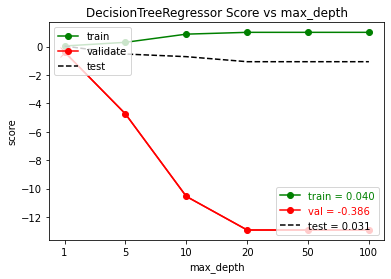

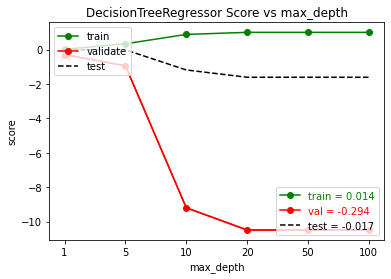

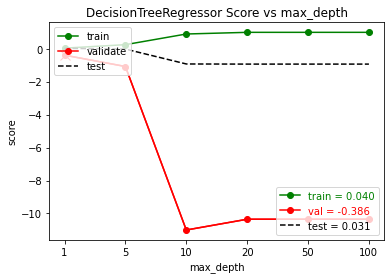

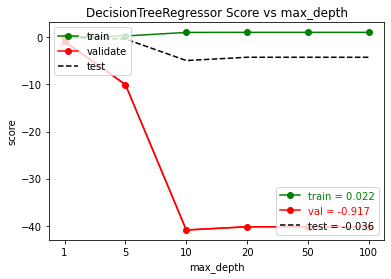

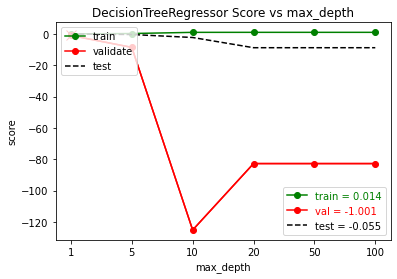

...

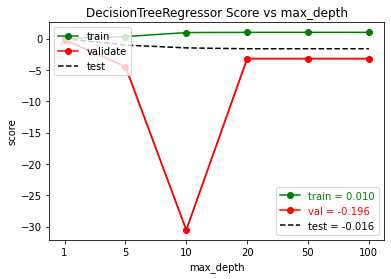

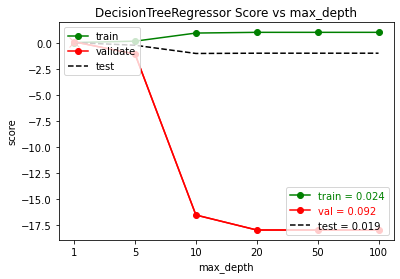

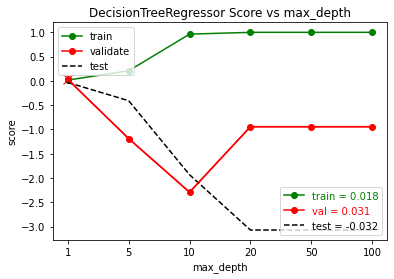

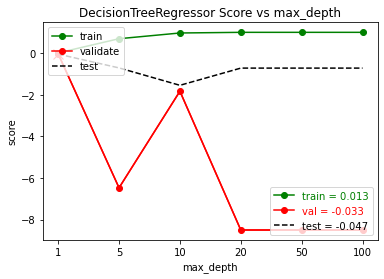

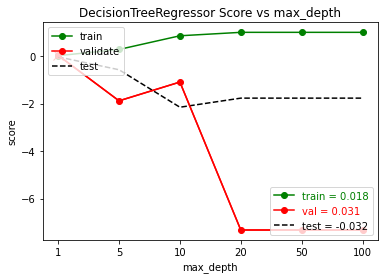

In [15]:
adjusted_parameter = 'max_depth'
adjusted_parameter_values = [1, 5, 10, 20, 50, 100]

for target in targets:
    DecisionTreeEstimators = train_estimators(drop_X_train, y_train[target],
                                                DecisionTreeRegressor,
                                                adjusted_parameter, adjusted_parameter_values,
                                                splitter='random',
                                                random_state=0)
    plot_estimator_scores(DecisionTreeEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            drop_X_train, y_train[target], drop_X_test, y_test[target], drop_X_val, y_val[target])

    DecisionTreeEstimators = train_estimators(OE_X_train, y_train[target],
                                                DecisionTreeRegressor,
                                                adjusted_parameter, adjusted_parameter_values,
                                                splitter='random',
                                                random_state=0)
    plot_estimator_scores(DecisionTreeEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OE_X_train, y_train[target], OE_X_test, y_test[target], OE_X_val, y_val[target])


    DecisionTreeEstimators = train_estimators(OH_X_train, y_train[target],
                                                DecisionTreeRegressor,
                                                adjusted_parameter, adjusted_parameter_values,
                                                splitter='random',
                                                random_state=0)
    plot_estimator_scores(DecisionTreeEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OH_X_train, y_train[target], OH_X_test, y_test[target], OH_X_val, y_val[target])

### Random Forest Classification

Training RandomForestRegressor(max_depth=1, random_state=0)...
Training RandomForestRegressor(max_depth=5, random_state=0)...
Training RandomForestRegressor(max_depth=10, random_state=0)...
Training RandomForestRegressor(max_depth=20, random_state=0)...
Training RandomForestRegressor(max_depth=50, random_state=0)...
Training RandomForestRegressor(max_depth=100, random_state=0)...
Training RandomForestRegressor(max_depth=1, random_state=0)...
Training RandomForestRegressor(max_depth=5, random_state=0)...
Training RandomForestRegressor(max_depth=10, random_state=0)...
Training RandomForestRegressor(max_depth=20, random_state=0)...
Training RandomForestRegressor(max_depth=50, random_state=0)...
Training RandomForestRegressor(max_depth=100, random_state=0)...
Training RandomForestRegressor(max_depth=1, random_state=0)...
Training RandomForestRegressor(max_depth=5, random_state=0)...
Training RandomForestRegressor(max_depth=10, random_state=0)...
Training RandomForestRegressor(max_depth=20,

c:\Users\pasca\Google Drive\University Documents\2021 - Fall\COMP 432\comp_432_group_project\notebooks\regression\utilities.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Training RandomForestRegressor(max_depth=1, random_state=0)...
Training RandomForestRegressor(max_depth=5, random_state=0)...
Training RandomForestRegressor(max_depth=10, random_state=0)...
Training RandomForestRegressor(max_depth=20, random_state=0)...
Training RandomForestRegressor(max_depth=50, random_state=0)...
Training RandomForestRegressor(max_depth=100, random_state=0)...
Training RandomForestRegressor(max_depth=1, random_state=0)...
Training RandomForestRegressor(max_depth=5, random_state=0)...
Training RandomForestRegressor(max_depth=10, random_state=0)...
Training RandomForestRegressor(max_depth=20, random_state=0)...
Training RandomForestRegressor(max_depth=50, random_state=0)...
Training RandomForestRegressor(max_depth=100, random_state=0)...
Training RandomForestRegressor(max_depth=1, random_state=0)...
Training RandomForestRegressor(max_depth=5, random_state=0)...
Training RandomForestRegressor(max_depth=10, random_state=0)...
Training RandomForestRegressor(max_depth=20,

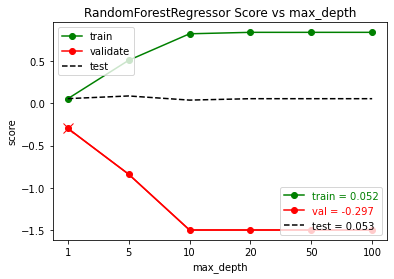

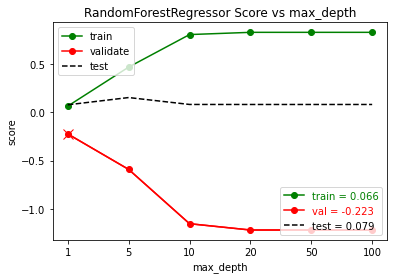

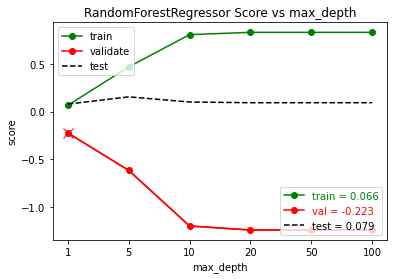

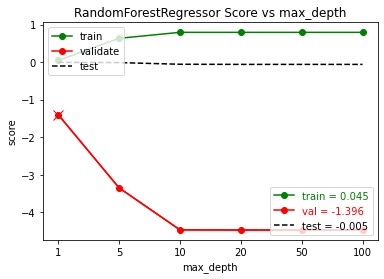

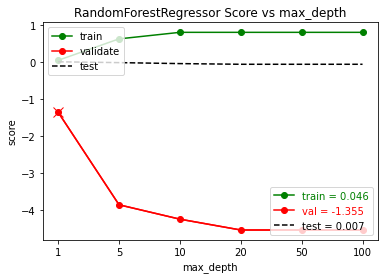

...

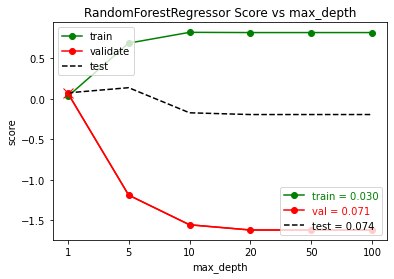

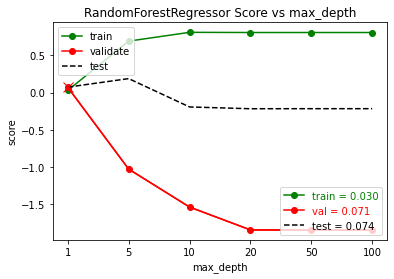

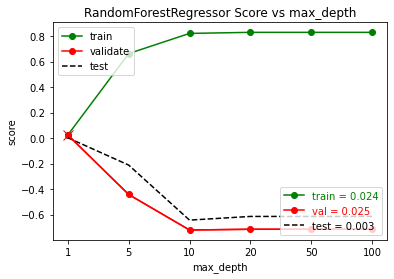

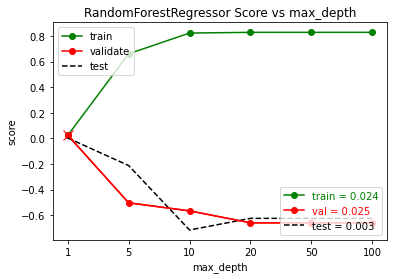

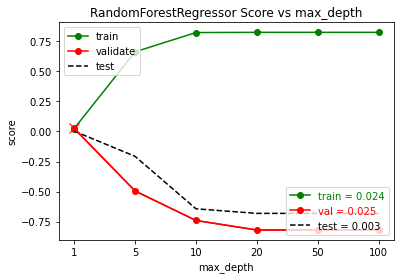

In [16]:
adjusted_parameter = 'max_depth'
adjusted_parameter_values = [1, 5, 10, 20, 50, 100]

for target in targets:
    RandomTreeEstimators = train_estimators(drop_X_train, y_train[target],
                                            RandomForestRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            random_state=0)
    plot_estimator_scores(RandomTreeEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            drop_X_train, y_train[target], drop_X_test, y_test[target], drop_X_val, y_val[target])


    RandomTreeEstimators = train_estimators(OE_X_train, y_train[target],
                                            RandomForestRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            random_state=0)
    plot_estimator_scores(RandomTreeEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OE_X_train, y_train[target], OE_X_test, y_test[target], OE_X_val, y_val[target])


    RandomTreeEstimators = train_estimators(OH_X_train, y_train[target],
                                            RandomForestRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            random_state=0)
    plot_estimator_scores(RandomTreeEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OH_X_train, y_train[target], OH_X_test, y_test[target], OH_X_val, y_val[target])

### K-Nearest Neighbours Classification

Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weig

c:\Users\pasca\Google Drive\University Documents\2021 - Fall\COMP 432\comp_432_group_project\notebooks\regression\utilities.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeighborsRegressor(weights=distance, n_neighbors=2)...
Training KNeighborsRegressor(weights=uniform, n_neighbors=2)...
Training KNeigh

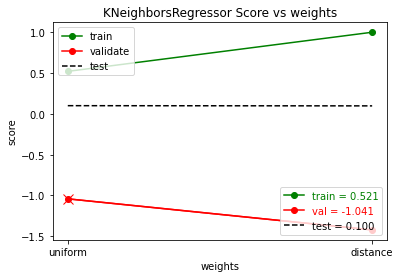

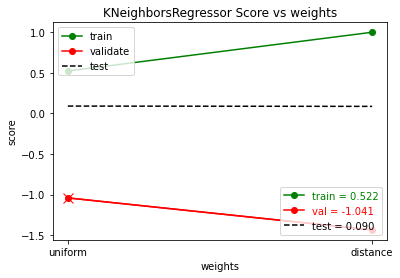

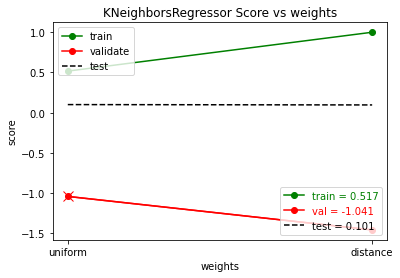

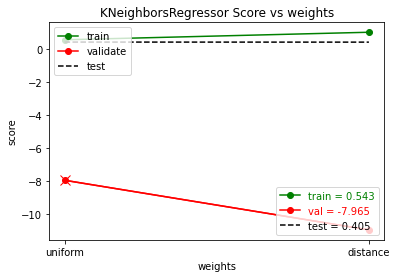

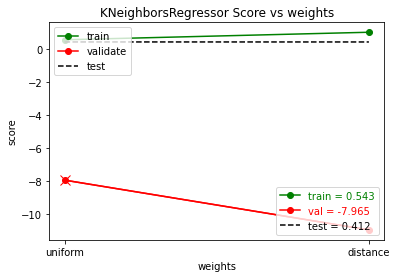

...

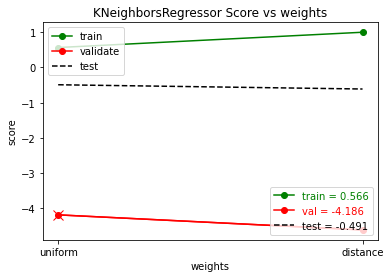

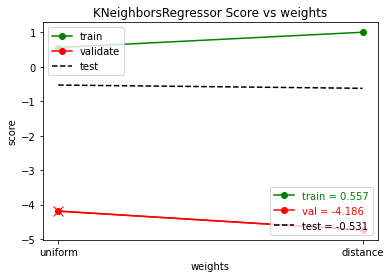

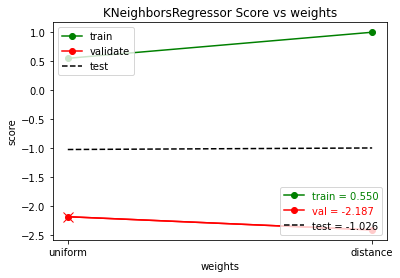

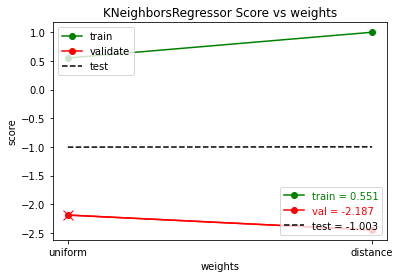

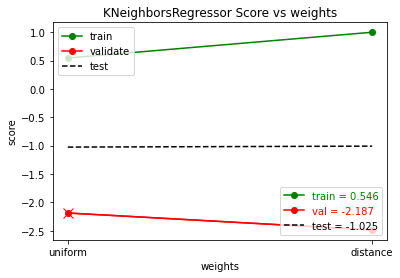

In [17]:
adjusted_parameter = 'weights'
adjusted_parameter_values = ['uniform','distance']

for target in targets:
    KNearestEstimators = train_estimators(drop_X_train, y_train[target],
                                            KNeighborsRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            n_neighbors=2)
    plot_estimator_scores(KNearestEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            drop_X_train, y_train[target], drop_X_test, y_test[target], drop_X_val, y_val[target])


    KNearestEstimators = train_estimators(OE_X_train, y_train[target],
                                            KNeighborsRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            n_neighbors=2)
    plot_estimator_scores(KNearestEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OE_X_train, y_train[target], OE_X_test, y_test[target], OE_X_val, y_val[target])


    KNearestEstimators = train_estimators(OH_X_train, y_train[target],
                                            KNeighborsRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            n_neighbors=2)
    plot_estimator_scores(KNearestEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OH_X_train, y_train[target], OH_X_test, y_test[target], OH_X_val, y_val[target])

Training KNeighborsRegressor(algorithm=auto, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=ball_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=kd_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=brute, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=auto, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=ball_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=kd_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=brute, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=auto, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=ball_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=kd_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=brute, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=auto, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=ball_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=kd_tree, n_neighbors=2)...
Training KNeighborsR

c:\Users\pasca\Google Drive\University Documents\2021 - Fall\COMP 432\comp_432_group_project\notebooks\regression\utilities.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Training KNeighborsRegressor(algorithm=auto, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=ball_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=kd_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=brute, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=auto, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=ball_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=kd_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=brute, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=auto, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=ball_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=kd_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=brute, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=auto, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=ball_tree, n_neighbors=2)...
Training KNeighborsRegressor(algorithm=kd_tree, n_neighbors=2)...
Training KNeighborsR

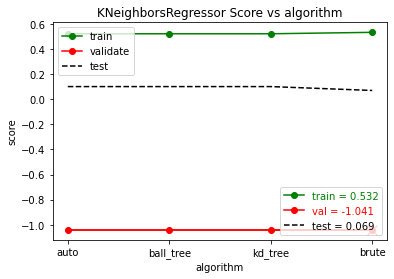

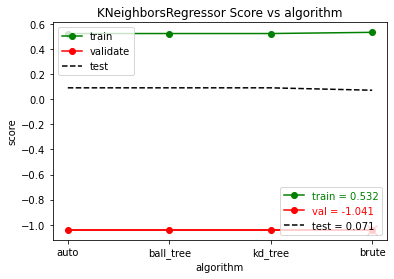

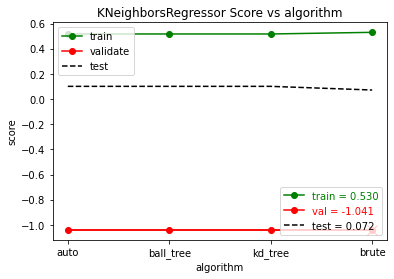

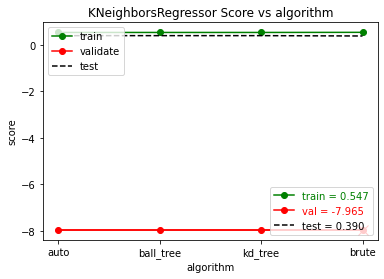

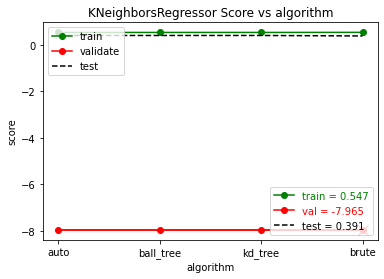

...

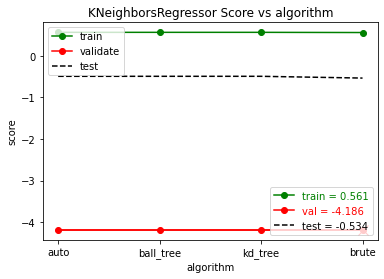

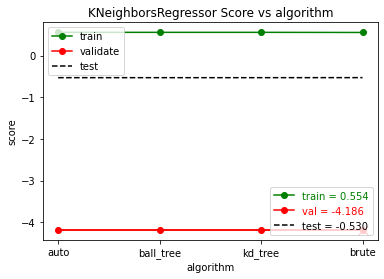

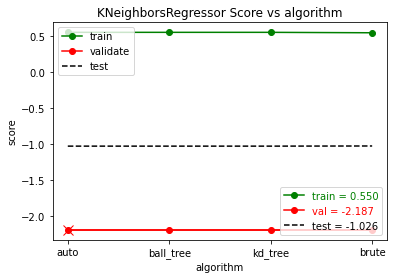

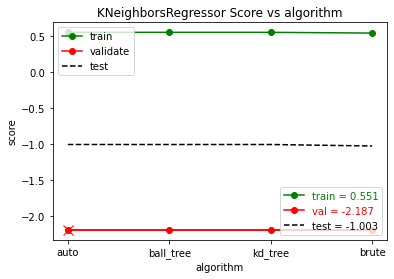

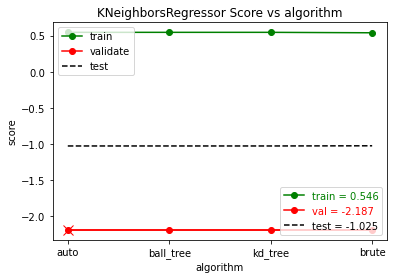

In [18]:
adjusted_parameter = 'algorithm'
adjusted_parameter_values = ['auto', 'ball_tree', 'kd_tree','brute']

for target in targets:
    KNearestEstimators = train_estimators(drop_X_train, y_train[target],
                                            KNeighborsRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            n_neighbors=2)
    plot_estimator_scores(KNearestEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            drop_X_train, y_train[target], drop_X_test, y_test[target], drop_X_val, y_val[target])


    KNearestEstimators = train_estimators(OE_X_train, y_train[target],
                                            KNeighborsRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            n_neighbors=2)
    plot_estimator_scores(KNearestEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OE_X_train, y_train[target], OE_X_test, y_test[target], OE_X_val, y_val[target])


    KNearestEstimators = train_estimators(OH_X_train, y_train[target],
                                            KNeighborsRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            n_neighbors=2)
    plot_estimator_scores(KNearestEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OH_X_train, y_train[target], OH_X_test, y_test[target], OH_X_val, y_val[target])

### Ada Boost Classification

Training AdaBoostRegressor(n_estimators=10, random_state=0)...
Training AdaBoostRegressor(n_estimators=50, random_state=0)...
Training AdaBoostRegressor(n_estimators=100, random_state=0)...
Training AdaBoostRegressor(n_estimators=500, random_state=0)...
Training AdaBoostRegressor(n_estimators=1000, random_state=0)...
Training AdaBoostRegressor(n_estimators=5000, random_state=0)...
Training AdaBoostRegressor(n_estimators=10, random_state=0)...
Training AdaBoostRegressor(n_estimators=50, random_state=0)...
Training AdaBoostRegressor(n_estimators=100, random_state=0)...
Training AdaBoostRegressor(n_estimators=500, random_state=0)...
Training AdaBoostRegressor(n_estimators=1000, random_state=0)...
Training AdaBoostRegressor(n_estimators=5000, random_state=0)...
Training AdaBoostRegressor(n_estimators=10, random_state=0)...
Training AdaBoostRegressor(n_estimators=50, random_state=0)...
Training AdaBoostRegressor(n_estimators=100, random_state=0)...
Training AdaBoostRegressor(n_estimators=50

c:\Users\pasca\Google Drive\University Documents\2021 - Fall\COMP 432\comp_432_group_project\notebooks\regression\utilities.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Training AdaBoostRegressor(n_estimators=10, random_state=0)...
Training AdaBoostRegressor(n_estimators=50, random_state=0)...
Training AdaBoostRegressor(n_estimators=100, random_state=0)...
Training AdaBoostRegressor(n_estimators=500, random_state=0)...
Training AdaBoostRegressor(n_estimators=1000, random_state=0)...
Training AdaBoostRegressor(n_estimators=5000, random_state=0)...
Training AdaBoostRegressor(n_estimators=10, random_state=0)...
Training AdaBoostRegressor(n_estimators=50, random_state=0)...
Training AdaBoostRegressor(n_estimators=100, random_state=0)...
Training AdaBoostRegressor(n_estimators=500, random_state=0)...
Training AdaBoostRegressor(n_estimators=1000, random_state=0)...
Training AdaBoostRegressor(n_estimators=5000, random_state=0)...
Training AdaBoostRegressor(n_estimators=10, random_state=0)...
Training AdaBoostRegressor(n_estimators=50, random_state=0)...
Training AdaBoostRegressor(n_estimators=100, random_state=0)...
Training AdaBoostRegressor(n_estimators=50

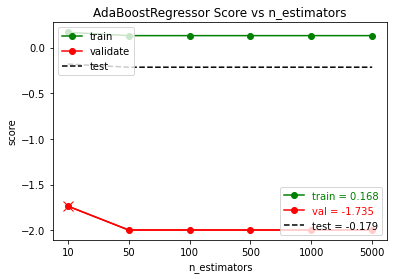

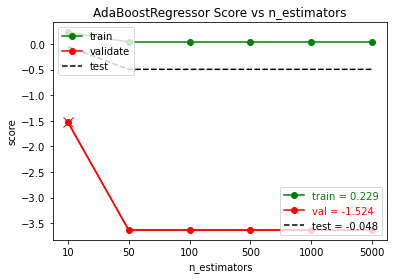

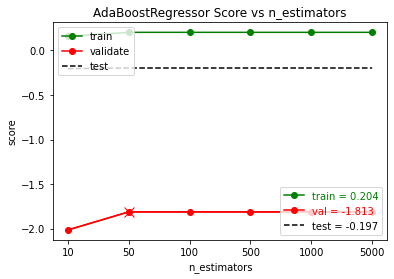

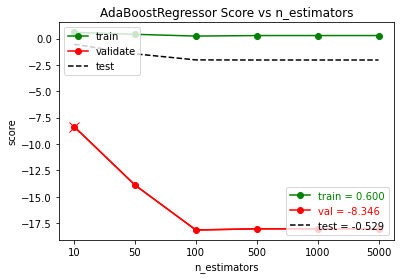

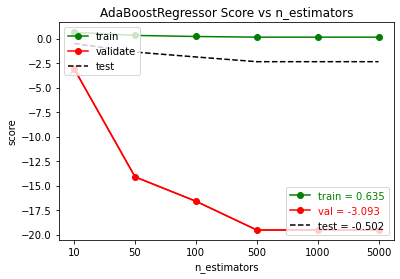

...

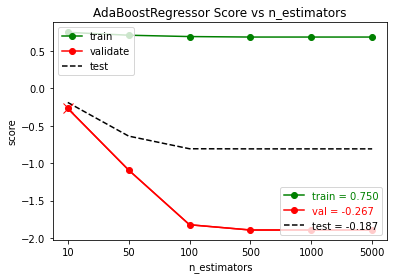

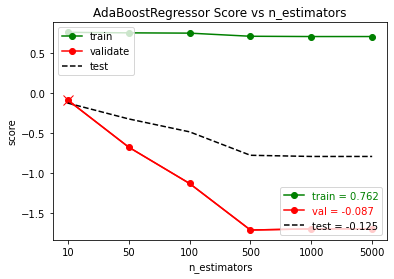

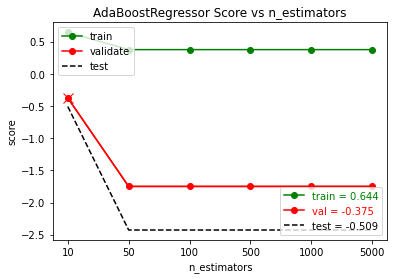

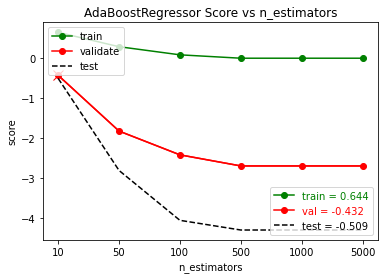

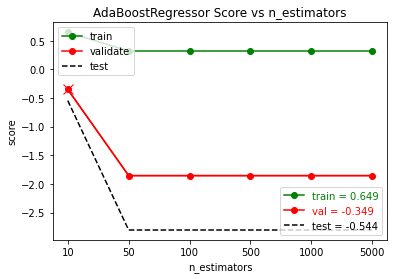

In [19]:
adjusted_parameter = 'n_estimators'
adjusted_parameter_values = [10, 50, 100, 500, 1000, 5000]

for target in targets:
    AdaBoostEstimators = train_estimators(drop_X_train, y_train[target],
                                            AdaBoostRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            random_state=0)
    plot_estimator_scores(AdaBoostEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            drop_X_train, y_train[target], drop_X_test, y_test[target], drop_X_val, y_val[target])


    AdaBoostEstimators = train_estimators(OE_X_train, y_train[target],
                                            AdaBoostRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            random_state=0)
    plot_estimator_scores(AdaBoostEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OE_X_train, y_train[target], OE_X_test, y_test[target], OE_X_val, y_val[target])


    AdaBoostEstimators = train_estimators(OH_X_train, y_train[target],
                                            AdaBoostRegressor,
                                            adjusted_parameter, adjusted_parameter_values,
                                            random_state=0)
    plot_estimator_scores(AdaBoostEstimators,
                            adjusted_parameter, adjusted_parameter_values,
                            OH_X_train, y_train[target], OH_X_test, y_test[target], OH_X_val, y_val[target])

### Gaussian Naive Bayes Classification

In [20]:
for target in targets:
    drop_gaussian_nb = GaussianProcessRegressor()
    NaiveBayesRegressor = drop_gaussian_nb.fit(drop_X_train, y_train[target])
    gaussian_process_train_score = NaiveBayesRegressor.score(drop_X_train, y_train[target])
    gaussian_process_test_score =  NaiveBayesRegressor.score(drop_X_test, y_test[target])
    gaussian_process_val_score =  NaiveBayesRegressor.score(drop_X_val, y_val[target])
    print(f'{gaussian_process_train_score=}, {gaussian_process_val_score=}, {gaussian_process_test_score=}')

    OE_gaussian_nb = GaussianProcessRegressor()
    NaiveBayesRegressor = OE_gaussian_nb.fit(OE_X_train, y_train[target])
    gaussian_process_train_score = NaiveBayesRegressor.score(OE_X_train, y_train[target])
    gaussian_process_test_score =  NaiveBayesRegressor.score(OE_X_test, y_test[target])
    gaussian_process_val_score =  NaiveBayesRegressor.score(OE_X_val, y_val[target])
    print(f'{gaussian_process_train_score=}, {gaussian_process_val_score=}, {gaussian_process_test_score=}')

    OH_gaussian_nb = GaussianProcessRegressor()
    NaiveBayesRegressor = OH_gaussian_nb.fit(OH_X_train, y_train[target])
    gaussian_process_train_score = NaiveBayesRegressor.score(OH_X_train, y_train[target])
    gaussian_process_test_score =  NaiveBayesRegressor.score(OH_X_test, y_test[target])
    gaussian_process_val_score =  NaiveBayesRegressor.score(OH_X_val, y_val[target])
    print(f'{gaussian_process_train_score=}, {gaussian_process_val_score=}, {gaussian_process_test_score=}')

gaussian_process_train_score=0.9999687911692283, gaussian_process_val_score=-0.4526073795743477, gaussian_process_test_score=-0.33146333855770216
gaussian_process_train_score=0.9999687911692283, gaussian_process_val_score=-0.463040297232312, gaussian_process_test_score=-0.36316515559800444
gaussian_process_train_score=0.9999687911692283, gaussian_process_val_score=-0.4737851562765507, gaussian_process_test_score=-0.35961391022667555
gaussian_process_train_score=0.9999917317583833, gaussian_process_val_score=-0.37933422919132864, gaussian_process_test_score=-0.15984816081810727
gaussian_process_train_score=0.9999917317583833, gaussian_process_val_score=-0.39049208997144924, gaussian_process_test_score=-0.19552755722370785
gaussian_process_train_score=0.9999917317583833, gaussian_process_val_score=-0.40219079274254255, gaussian_process_test_score=-0.1916845639699991
gaussian_process_train_score=0.9999219970684465, gaussian_process_val_score=-1.0633919481394503, gaussian_process_test_scor

### Neural Network Classification Through a Multi-Layer Perceptron

In [11]:
for target in targets:
    mlp = MLPRegressor(hidden_layer_sizes=(), activation='relu',
                                            batch_size=100, max_iter=1000, learning_rate_init=0.01,
                                            momentum=0.4, random_state=0, verbose=False).fit(drop_X_train, y_train[target])
    print(f'Prediction for {target}')
    print(f'Training Score: {mlp.score(drop_X_train, y_train[target])}')
    print(f'Testing Score: {mlp.score(drop_X_val, y_val[target])}')
    print(f'Validation Score: {mlp.score(drop_X_test, y_test[target])}')
    print()

    mlp = MLPRegressor(hidden_layer_sizes=(16), activation='relu',
                                                batch_size=100, max_iter=1000, learning_rate_init=0.01,
                                                momentum=0.4, random_state=0, verbose=False).fit(drop_X_train, y_train[target])

    print(f'Prediction for {target}')
    print(f'Training Score: {mlp.score(drop_X_train, y_train[target])}')
    print(f'Testing Score: {mlp.score(drop_X_val, y_val[target])}')
    print(f'Validation Score: {mlp.score(drop_X_test, y_test[target])}')
    print()


Prediction for reach
Training Score: -0.021785367249078647
Testing Score: -0.2177064668088351
Validation Score: -0.026370953543727316

Prediction for reach
Training Score: -0.021509533658805813
Testing Score: -0.19857910658778244
Validation Score: -0.027325289382381213

Prediction for impressions
Training Score: -0.015026170049603271
Testing Score: -0.43398310060066647
Validation Score: -0.018650403809870486

Prediction for impressions
Training Score: -0.014992768336071105
Testing Score: -0.45479010316481494
Validation Score: -0.01935411900949191

Prediction for engagements
Training Score: -0.04384150457831604
Testing Score: -0.07513337261572883
Validation Score: -0.03618170599724113

Prediction for engagements
Training Score: -0.04210113318000053
Testing Score: -0.10004137976344629
Validation Score: -0.04480614674265926

Prediction for consumers
Training Score: -0.05062359193067545
Testing Score: -0.08902117755652417
Validation Score: -0.03838853142036047

Prediction for consumers
Tra

In [13]:
for target in targets:
    mlp = MLPRegressor(hidden_layer_sizes=(), activation='relu',
                                            batch_size=100, max_iter=1000, learning_rate_init=0.01,
                                            momentum=0.4, random_state=0, verbose=False).fit(OE_X_train, y_train[target])

    print(f'Prediction for {target}')
    print(f'Training Score: {mlp.score(OE_X_train, y_train[target])}')
    print(f'Testing Score: {mlp.score(OE_X_val, y_val[target])}')
    print(f'Validation Score: {mlp.score(OE_X_test, y_test[target])}')
    print()

    mlp = MLPRegressor(hidden_layer_sizes=(16), activation='relu',
                                                batch_size=100, max_iter=1000, learning_rate_init=0.01,
                                                momentum=0.4, random_state=0, verbose=False).fit(OE_X_train, y_train[target])

    print(f'Prediction for {target}')
    print(f'Training Score: {mlp.score(OE_X_train, y_train[target])}')
    print(f'Testing Score: {mlp.score(OE_X_val, y_val[target])}')
    print(f'Validation Score: {mlp.score(OE_X_test, y_test[target])}')
    print()

Prediction for reach
Training Score: -0.021544968583928847
Testing Score: -0.17397920030989122
Validation Score: -0.02902277512054674

Prediction for reach
Training Score: -0.02150844393973994
Testing Score: -0.18310707184591246
Validation Score: -0.028309644265187783

Prediction for impressions
Training Score: -0.015004652251792816
Testing Score: -0.46569936641032017
Validation Score: -0.019735436912708515

Prediction for impressions
Training Score: -0.0151013987598283
Testing Score: -0.4028844587232816
Validation Score: -0.01771386251416196

Prediction for engagements
Training Score: -0.04211856300494432
Testing Score: -0.08340334106051017
Validation Score: -0.03841456145825184

Prediction for engagements
Training Score: -0.07286479579156735
Testing Score: -0.06840282524857644
Validation Score: -0.05958235778335519

Prediction for consumers
Training Score: -0.04904424183725942
Testing Score: -0.09370077938860644
Validation Score: -0.03824691885739284

Prediction for consumers
Trainin

In [15]:
for target in targets:
    mlp = MLPRegressor(hidden_layer_sizes=(), activation='relu',
                                            batch_size=100, max_iter=1000, learning_rate_init=0.01,
                                            momentum=0.4, random_state=0, verbose=False).fit(OH_X_train, y_train[target])

    print(f'Prediction for {target}')
    print(f'Training Score: {mlp.score(OH_X_train, y_train[target])}')
    print(f'Testing Score: {mlp.score(OH_X_val, y_val[target])}')
    print(f'Validation Score: {mlp.score(OH_X_test, y_test[target])}')
    print()

    mlp = MLPRegressor(hidden_layer_sizes=(16), activation='relu',
                                                batch_size=100, max_iter=1000, learning_rate_init=0.01,
                                                momentum=0.4, random_state=0, verbose=False).fit(OH_X_train, y_train[target])

    print(f'Prediction for {target}')
    print(f'Training Score: {mlp.score(OH_X_train, y_train[target])}')
    print(f'Testing Score: {mlp.score(OH_X_val, y_val[target])}')
    print(f'Validation Score: {mlp.score(OH_X_test, y_test[target])}')
    print()

Prediction for reach
Training Score: -0.021987959093070275
Testing Score: -0.151597818076874
Validation Score: -0.031100371361672874

Prediction for reach
Training Score: -0.021545345241039016
Testing Score: -0.19919584690007652
Validation Score: -0.02728713976166075

Prediction for impressions
Training Score: -0.015010627894118
Testing Score: -0.4504651277639391
Validation Score: -0.019195263541310403

Prediction for impressions
Training Score: -0.015751830287563218
Testing Score: -0.6197862979032092
Validation Score: -0.026436322881477237

Prediction for engagements
Training Score: -0.04200584942088348
Testing Score: -0.08872260683496358
Validation Score: -0.03986105092537606

Prediction for engagements
Training Score: -0.04214146332380153
Testing Score: -0.0974272507709808
Validation Score: -0.04358117700808273

Prediction for consumers
Training Score: -0.04863481568736594
Testing Score: -0.10844338629808692
Validation Score: -0.04074874760338432

Prediction for consumers
Training S